# Homework 3 
**Fatemeh Ahmadvand s301384**

In [1]:
import scipy
import numpy as np # To input the adjacency matrix as a 2-D array
import networkx as nx # To use graph features
import matplotlib.pyplot as plt # To display a graphical view of the graph
from scipy.sparse import csr_matrix
from tqdm import tqdm
#from epidemics_func import PreferentialAttachment, Infection, InfectionV, Recovery, Epidemic, 
#                           Epidemicw, Vaccinated, GradientOptimizer
import random
from sklearn.metrics import mean_squared_error
import itertools

### Problem 1

In [8]:
#init
n=500
states = []

#we create thr k-regilar matrix by shifting row elements in each row of adjacancy matrix
W=[]
v = np.zeros(n)
v[1] = 1
v[2] = 1
v[-1] = 1
v[-2] = 1

for i in range(n):
    W.append(v)
    v = np.roll(v, 1)
   
W=np.array(W).astype(int)

#sparse
W = csr_matrix(W)

In [3]:
# S=0 I=1 R=2
def Infection(node, beta, neighbors, state):
    #here since we already have the probability function we dont need to create lambda
    m = list(state[neighbors] == 1).count(True)
    p_infection  = 1 - (1 - beta)**m
    return np.random.choice([0, 1], p = [1-p_infection, p_infection])

In [4]:
#I=1 R=2
def Recovery(node, ro):
    return np.random.choice([1, 2], p = [1-ro, ro])

In [5]:
def Epidemicw(W, n = 500, beta = 0.3, ro = 0.7, init_inf_nodes = 10, num_simul = 100, steps = 15):
    stats_t = []
    inf_stats_t = []
    
    for sim in tqdm(range(num_simul)):

        #creation of intial config
        state = np.zeros(n, dtype = np.int8)
        #insertion of infected nodes
        initial_infected_nodes = np.random.choice(range(n), size = init_inf_nodes, replace = False)
        state[initial_infected_nodes] = 1
        states = []
        #insertion of others nodes
        states.append([n - init_inf_nodes, init_inf_nodes, 0])
        
        #generation of new states
        new_state = np.copy(state)
        new_inf_nodes = []
        new_inf_nodes.append(0)
        
        #creation of time frames and 
        for t in range(steps):
            infected_nodes = 0
            for node in range(n):
                if state[node] == 0: # S to I
                    new_state[node] = Infection(node, beta, W[node].indices, state)
                    if new_state[node] == 1:
                        infected_nodes += 1

                if state[node] == 1: # I to R
                    new_state[node] = Recovery(node, ro)

            #record each stats in time frame
            new_inf_nodes.append(infected_nodes)
            n_S = list(new_state == 0).count(True)
            n_I = list(new_state == 1).count(True)
            n_R = list(new_state == 2).count(True)
            states.append([n_S, n_I, n_R])
            state = np.copy(new_state)
        stats_t.append(states.copy())
        inf_stats_t.append(new_inf_nodes.copy())
        
        
    return stats_t, inf_stats_t

In [6]:
states, newinfections = Epidemicw(W, n = 500, init_inf_nodes = 10, beta = 0.3, ro = 0.7, num_simul = 100, steps = 15)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [02:18<00:00,  1.39s/it]


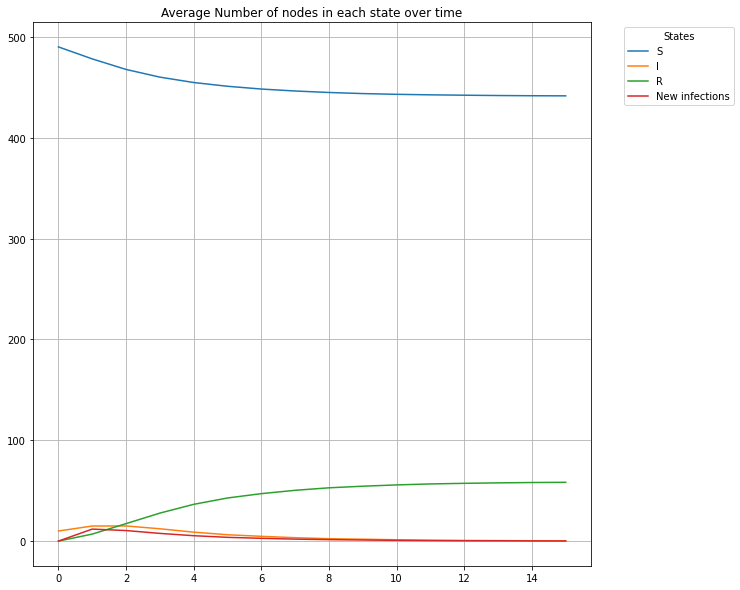

In [7]:
plt.figure(0, figsize=(10, 10))
plt.title("Average Number of nodes in each state over time")
plt.grid()
plt.plot(range(16), np.mean(states, axis = 0)[:, 0], label = "S")
plt.plot(range(16), np.mean(states, axis = 0)[:, 1], label = "I")
plt.plot(range(16), np.mean(states, axis = 0)[:, 2], label = "R")
plt.plot(range(16), np.mean(newinfections, axis = 0), label='New infections')
plt.legend(title='States', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [8]:
def PreferentialAttachment(k, n_nodes):
    #starting with a complete graph
    G = nx.complete_graph(k+1)
    
    for t in range(k+1, n_nodes):
        if k % 2 != 0: #odd
            #our measure for selecting the degree
            c = int(np.ceil(k/2)) if t % 2 == 0 else int(np.floor(k/2))
        else: #even
            c = int(k/2)
        degrees = [d for n, d in G.degree()] 
        degrees /= np.sum(degrees)
        neighbors = np.random.choice(list(G.nodes), p=degrees, size=c, replace=False)
        #for every time t  we select the node with stochatisc rule to connect
        G.add_node(t)
        for n in neighbors:
            G.add_edge(t, n)

    return G

In [9]:
G = PreferentialAttachment(6, 1000)

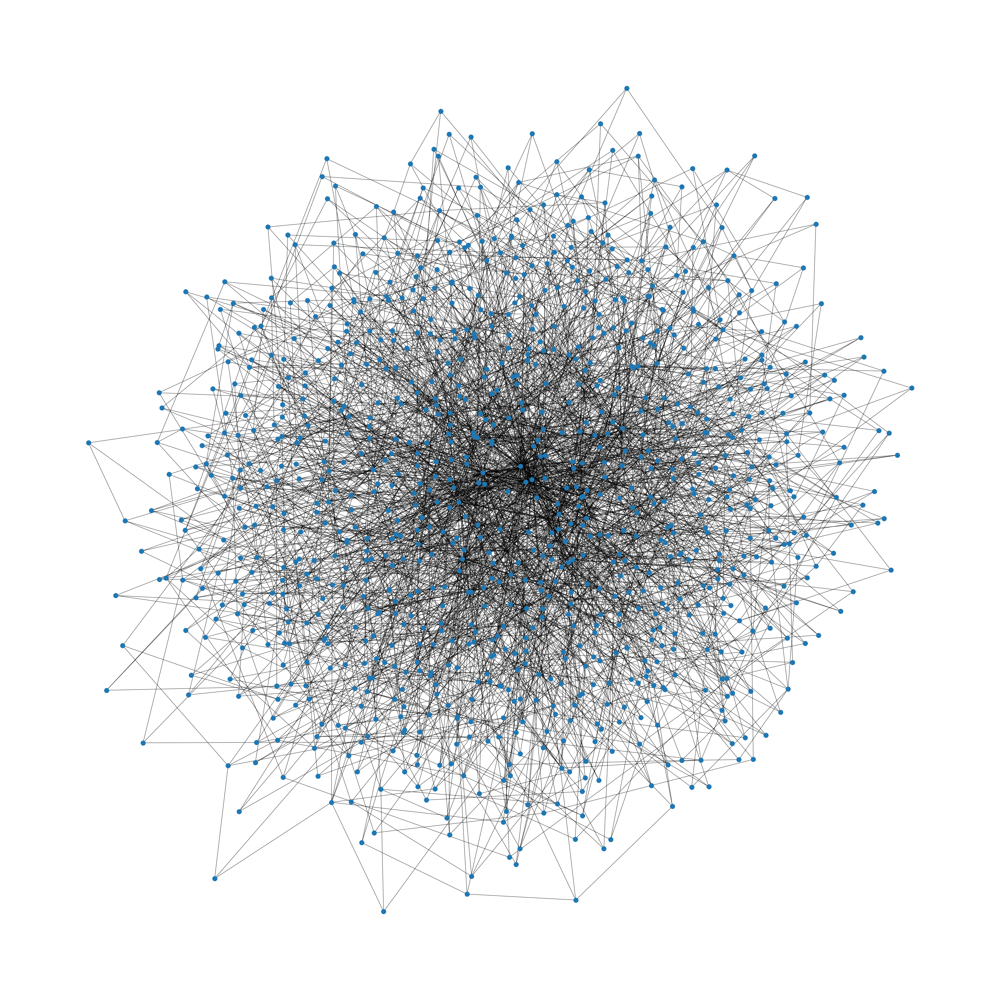

In [10]:
plt.figure(figsize=(50,50))
nx.draw(G, with_labels = False)

### Problem 2 - Simulate a pandemic without vaccination


In [11]:
#following the algorithm used in previous section we generate our random graph
G = PreferentialAttachment(k = 6, n_nodes = 500)
W = nx.adjacency_matrix(G)
statess, newinfectionss = Epidemicw(W, n = len(G), init_inf_nodes = 10, beta = 0.3, ro = 0.7, num_simul = 100, steps = 15)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [01:10<00:00,  1.42it/s]


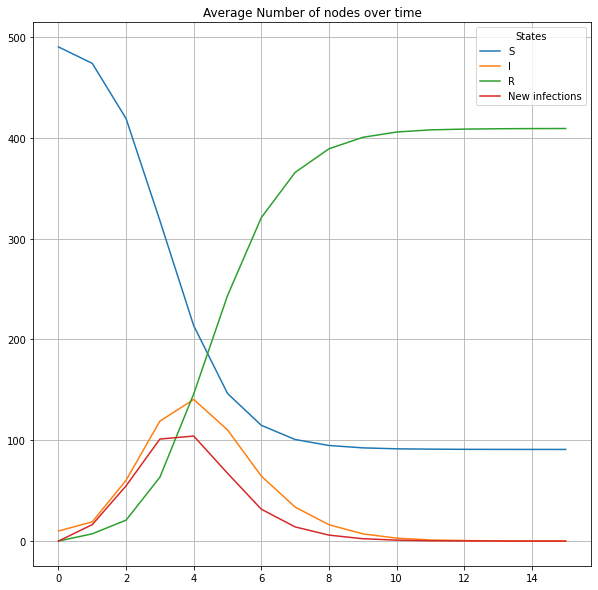

In [12]:
plt.figure(0, figsize=(10, 10))
plt.title("Average Number of nodes over time")
plt.grid()
plt.plot(range(16), np.mean(statess, axis = 0)[:, 0], label = "S")
plt.plot(range(16), np.mean(statess, axis = 0)[:, 1], label = "I")
plt.plot(range(16), np.mean(statess, axis = 0)[:, 2], label = "R")
plt.plot(range(16), np.mean(newinfectionss, axis = 0), label='New infections')
plt.legend(title='States', loc='upper right')
plt.show()

### Problem 3 - Simulate a pandemic with vaccination

In [13]:
def Vaccinated(W, vaccinated, amount):
    not_vaccinated = np.argwhere(vaccinated == 0).flatten()
    size = int(len(vaccinated)*amount/100)
    vaccinated_nodes = np.random.choice(not_vaccinated, size = size, replace = False)
    return vaccinated_nodes

In [14]:
def InfectionV(node, beta, neighbors, state, vaccinated):
    #here since we already have the probability function we dont need to create lambda
    m = 0
    neighbors = neighbors[vaccinated[neighbors] == 0]
    m = list(state[neighbors] == 1).count(True)
    p_infection  = 1 - (1 - beta)**m
    return np.random.choice([0, 1], p = [1-p_infection, p_infection])

In [15]:
# S=0 I=1 R=2
def Epidemic(k=6 , n = 500, beta = 0.3, ro = 0.7, init_inf_nodes = 10, num_simul = 100, steps = 16, vaccine = 0, referencev=0):
    stats_t = []
    inf_stats_t = []
    vaccine_schedule = [5, 9, 16, 24, 32, 40, 47, 54, 59, 60, 60, 60, 60, 60, 60, 60]
    reference_vac = [1, 1, 3, 5, 9, 17, 32, 32, 17, 5, 2, 1, 0, 0, 0, 0]
    vaccine = vaccine_schedule
    referencev=reference_vac
    #graph generator for omptimization case
    G = PreferentialAttachment(k = k, n_nodes = n)
    W = nx.adjacency_matrix(G)
    
    if vaccine == 0:
        for sim in tqdm(range(num_simul)):

            #creation of intial config
            state = np.zeros(n, dtype = np.int8)
            #insertion of infected nodes
            initial_infected_nodes = np.random.choice(range(n), size = init_inf_nodes, replace = False)
            state[initial_infected_nodes] = 1
            states = []
            #insertion of others nodes
            states.append([n - init_inf_nodes, init_inf_nodes, 0])

            #generation of new states
            new_state = np.copy(state)
            new_inf_nodes = []
            new_inf_nodes.append(0)

            #creation of time frames and 
            for t in range(steps):
                infected_nodes = 0
                for node in range(n):
                    if state[node] == 0: # S to I
                        new_state[node] = Infection(node, beta, W[node].indices, state)
                        if new_state[node] == 1:
                            infected_nodes += 1

                    if state[node] == 1: # I to R
                        new_state[node] = Recovery(node, ro)

                #record each stats in time frame
                new_inf_nodes.append(infected_nodes)
                n_S = list(new_state == 0).count(True)
                n_I = list(new_state == 1).count(True)
                n_R = list(new_state == 2).count(True)
                states.append([n_S, n_I, n_R])
                state = np.copy(new_state)
            stats_t.append(states.copy())
            inf_stats_t.append(new_inf_nodes.copy())
            
    else:
        for sim in tqdm(range(num_simul)):
    
            state = np.zeros(n, dtype = np.int8)
            initial_infected_nodes = np.random.choice(range(n), size = init_inf_nodes, replace = False)
            state[initial_infected_nodes] = 1
            states = []
            states.append([n - init_inf_nodes, n - init_inf_nodes, init_inf_nodes, 0, 0, 0])
            vaccinated = np.zeros(n, dtype = np.int8)
            new_state = np.copy(state)
            new_inf_nodes = []
            for t in range(steps):
                # Vaccinations
                amount = max(0, vaccine[t]-vaccine[t-1])
                if amount > 0:
                    vaccinated_nodes = Vaccinated(W, vaccinated, amount)
                    vaccinated[vaccinated_nodes] = 1
                infected_nodes = 0

                for node in range(n):
                    if state[node] == 0 and vaccinated[node] != 1: # S
                        new_state[node] = InfectionV(node, beta, W[node].indices, state, vaccinated)
                        if new_state[node] == 1:
                            infected_nodes += 1

                    if state[node] == 1: # I
                        new_state[node] = Recovery(node, ro)

                new_inf_nodes.append(infected_nodes)
                n_SV = list(vaccinated[new_state == 0] == 0).count(True) #S after I
                n_S = list(new_state == 0).count(True) # S by vaccine
                n_I = list(new_state == 1).count(True)
                n_R = list(new_state == 2).count(True)
                n_V = list(vaccinated == 1).count(True)
                
                states.append([n_SV, n_S, n_I, n_R, n_V, amount])
                state = np.copy(new_state)
            stats_t.append(states.copy())
            inf_stats_t.append(new_inf_nodes.copy())
    mean_inf_stats_t = np.mean(inf_stats_t, axis = 0)
    rmse = mean_squared_error(mean_inf_stats_t, referencev, squared=False)  
    return stats_t, inf_stats_t, mean_inf_stats_t, rmse

In [16]:
#following the algorithm used in previous section we generate our random graph
vaccine_schedule = [0, 5, 15, 25, 35, 45, 55, 60, 60, 60, 60, 60, 60, 60, 60]
statesv, newinfectionsv, mean, rsme = Epidemic(k=6, n = 500, init_inf_nodes = 10, beta = 0.3, ro = 0.7, num_simul = 100, steps = 16, vaccine = vaccine_schedule)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [01:11<00:00,  1.40it/s]


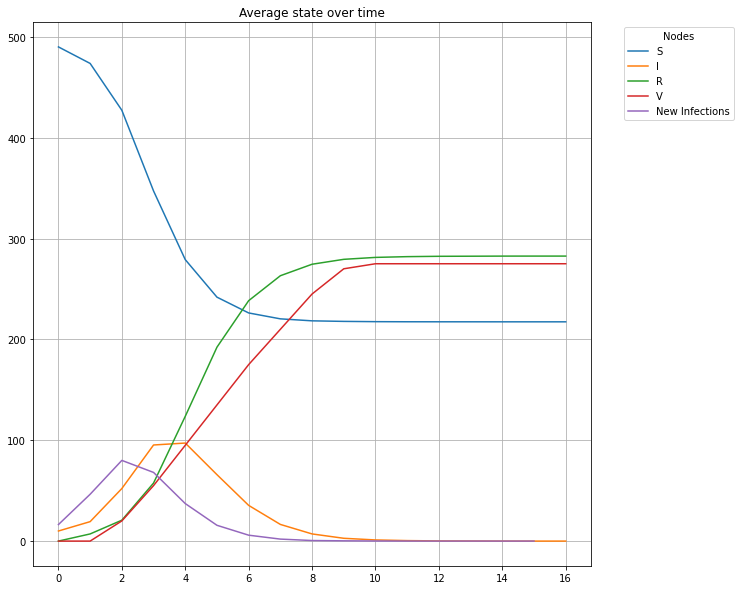

In [17]:
plt.figure(0, figsize=(10, 10))
plt.title("Average state over time")
plt.grid()
plt.plot(np.mean(statesv, axis = 0)[:, 1], label = "S")
plt.plot(np.mean(statesv, axis = 0)[:, 2], label = "I")
plt.plot(np.mean(statesv, axis = 0)[:, 3], label = "R")
plt.plot(np.mean(statesv, axis = 0)[:, 4], label = "V")
plt.plot(np.mean(newinfectionsv, axis = 0), label = "New Infections")
plt.legend(title='Nodes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### Problem 4 - The H1N1 pandemic in Sweden 2009

In [18]:
def GradientOptimizer(k=10, beta=0.3, ro=0.6, step_k=2, step_beta=0.1, step_ro=0.1):
    
    best_rmse = -1
    test = 0
    mult = 0.5
    threshold = 1e-5
    doupdate = 0
    ref_vac = [1, 1, 3, 5, 9, 17, 32, 32, 17, 5, 2, 1, 0, 0, 0, 0]

    while True:
        local_best = -1

        changed = False
        print(f"Starting Parameters with k={k:.3g}, beta={beta:.3g}, ro={ro:.3g}")

        choices = [set([max(0,beta-(mult**test)*step_beta), beta, min(1,beta+(mult**test)*step_beta)]), 
                   set([max(0,int(k-(mult**test)*step_k)), k, int(k+(mult**test)*step_k)]), 
                   set([max(0,ro-(mult**test)*step_ro), ro, min(1,ro+(mult**test)*step_ro)]) ]
        params = list(itertools.product(*choices))
        for i, param in enumerate(params):
            beta_sim, k_sim, ro_sim = param

            simulations_states, inf_stats_t, mean_inf, rmse = Epidemic(k = k_sim, beta = beta_sim, ro = ro_sim)

            if local_best == -1 or rmse < local_best:
                    best_local_mean = mean_inf
                    beta_local_best, k_local_best, ro_local_best = beta_sim, k_sim, ro_sim
                    local_best = rmse
                    local_best_states = simulations_states

        # Update global best
        if local_best < best_rmse or best_rmse == -1:
            best_states = local_best_states
            best_rmse = local_best
            best_mean = best_local_mean
            beta_best, k_best, ro_best = beta_local_best, k_local_best, ro_local_best
            changed = True

        if changed:
            print(f"Best RMSE located : {best_rmse:.3g} at: beta={beta_best:.3g} k={k_best:.3g} ro={ro_best:.3g}")  
            plt.figure(figsize=(10,10))
            plt.grid()
            plt.plot(range(16), best_mean, label='Model Approximation')
            plt.plot(range(16), ref_vac, label='Reference')
            plt.legend(title='Nodes', loc='upper left')
            plt.show()
            doupdate = 0
        else:
            doupdate += 1

        # Check if min hasn't moved
        if abs(beta_local_best - beta) < threshold and abs(k_local_best - k) < threshold and abs(ro_local_best - ro) < threshold and test <= 1:
            print("updating precision")
            test += 1
        # Move to new min
        elif abs(beta_local_best - beta) > threshold or abs(k_local_best - k) > threshold or abs(ro_local_best - ro) > threshold:
            print(f"Moving Local Optima")
            beta, k, ro = beta_local_best, k_local_best, ro_local_best
            test = 0
        # Termination conditions
        if test > 1 or doupdate >= 10:
            print("EXIT")
            break

    return beta_best, k_best, ro_best, best_states

Starting Parameters with k=10, beta=0.3, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:49<00:00,  2.03it/s]


Best RMSE located : 27 at: beta=0.2 k=8 ro=0.7


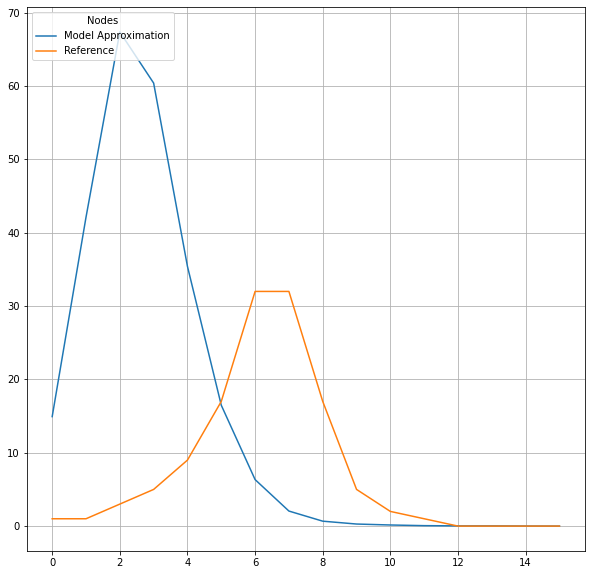

Moving Local Optima
Starting Parameters with k=8, beta=0.2, ro=0.7


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [01:13<00:00,  1.36it/s]


Best RMSE located : 12.2 at: beta=0.1 k=6 ro=0.6


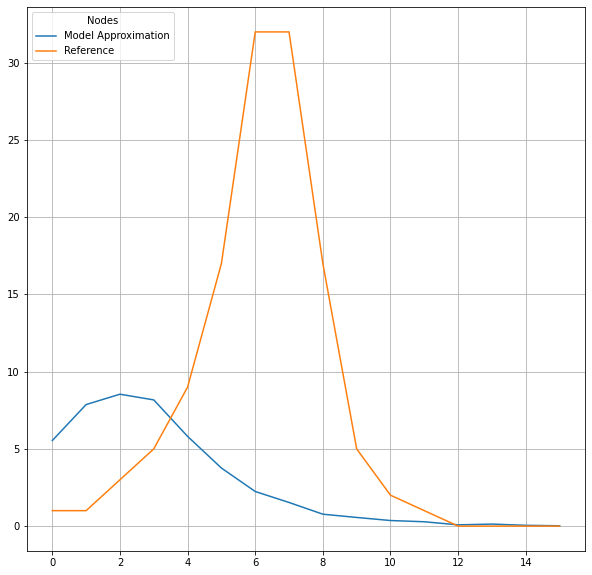

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.29it/s]

Best RMSE located : 11.5 at: beta=0.1 k=8 ro=0.5


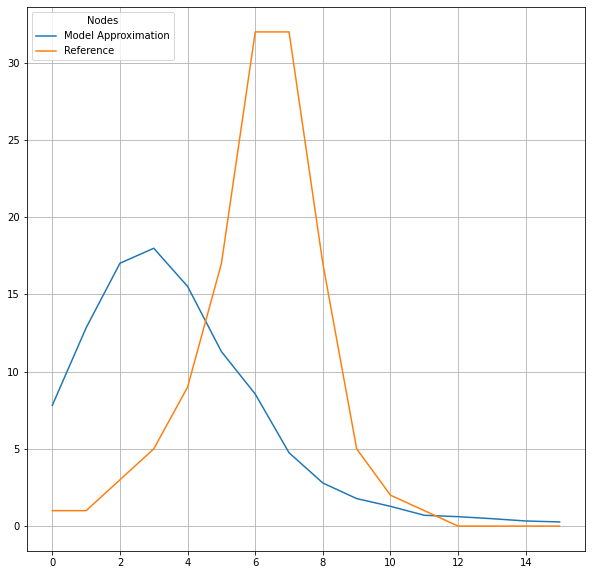

Moving Local Optima
Starting Parameters with k=8, beta=0.1, ro=0.5


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.32it/s]

Best RMSE located : 11.2 at: beta=0.1 k=6 ro=0.4


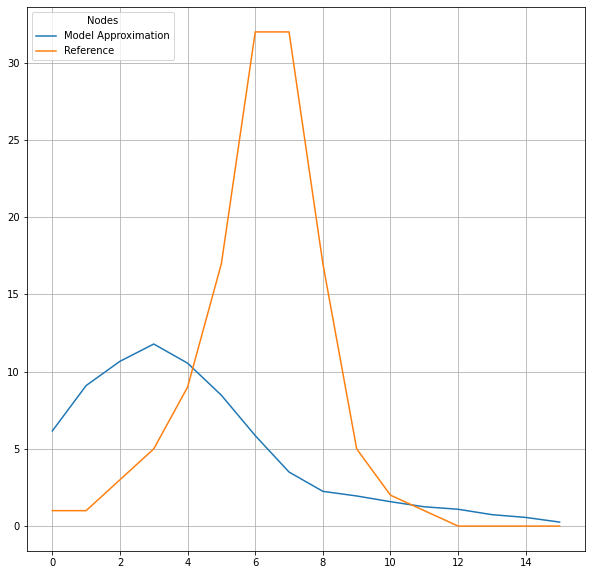

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.4


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.51it/s]

Best RMSE located : 10.5 at: beta=0.1 k=6 ro=0.3


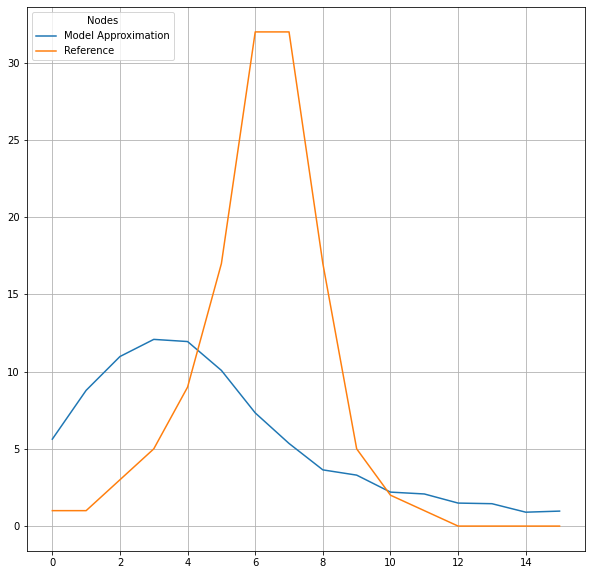

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.3


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.55it/s]

Best RMSE located : 9.95 at: beta=0.1 k=6 ro=0.2


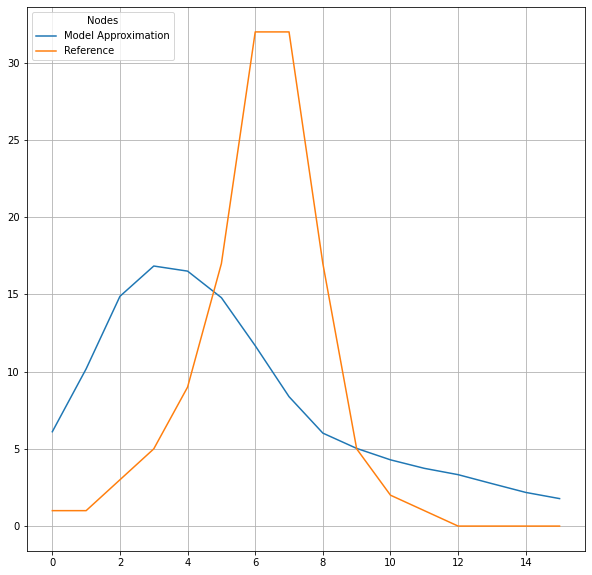

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.2


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.85it/s]

Best RMSE located : 9.76 at: beta=0.1 k=6 ro=0.1


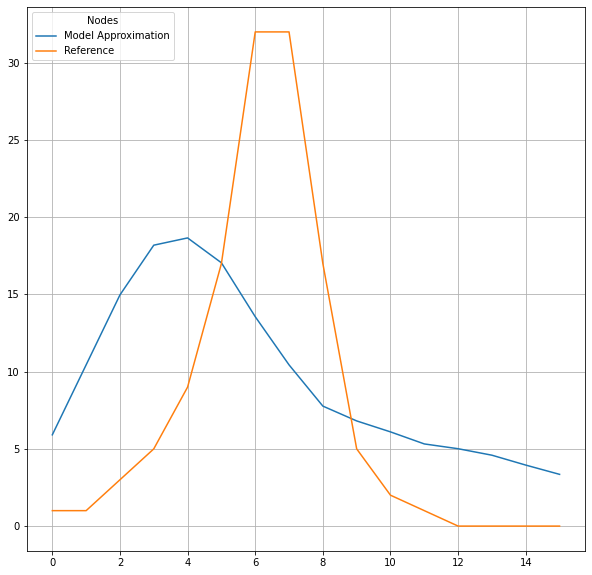

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.75it/s]

Best RMSE located : 9.43 at: beta=0.1 k=6 ro=0.1


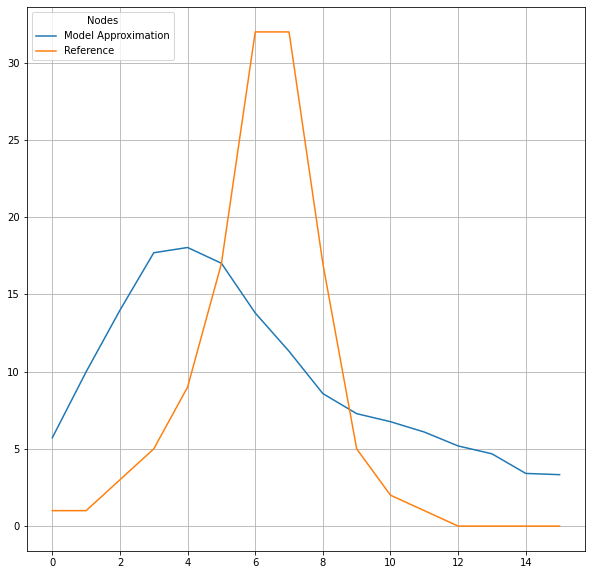

updating precision
Starting Parameters with k=6, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.55it/s]

Best RMSE located : 9.33 at: beta=0.1 k=6 ro=0.05


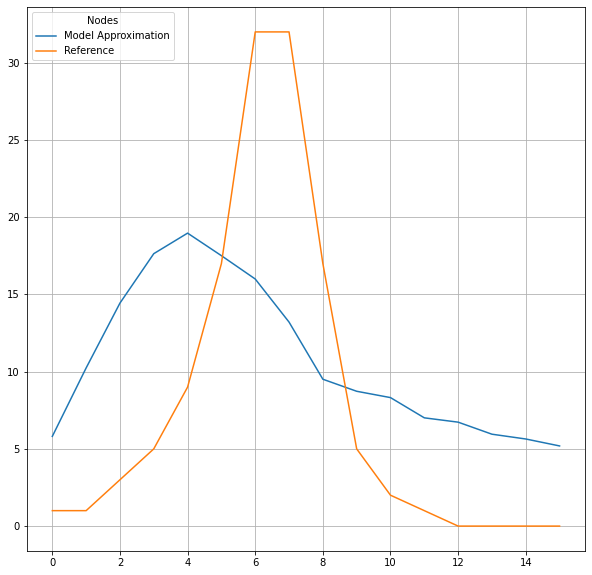

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.73it/s]


Moving Local Optima
Starting Parameters with k=4, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:27<00:00,  3.67it/s]


updating precision
Starting Parameters with k=4, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:32<00:00,  3.11it/s]

Best RMSE located : 9.32 at: beta=0.1 k=5 ro=0


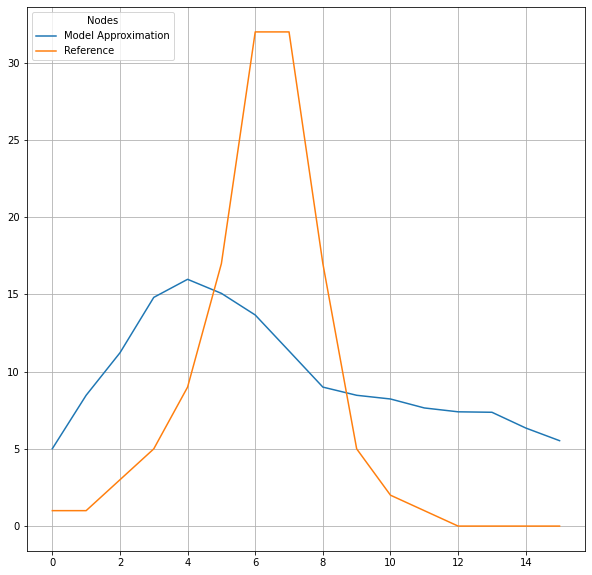

Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:32<00:00,  3.08it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:29<00:00,  3.43it/s]


Moving Local Optima
Starting Parameters with k=4, beta=0.15, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.18it/s]


updating precision
Starting Parameters with k=4, beta=0.15, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:31<00:00,  3.22it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:31<00:00,  3.20it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:32<00:00,  3.10it/s]

Best RMSE located : 9.29 at: beta=0.1 k=5 ro=0


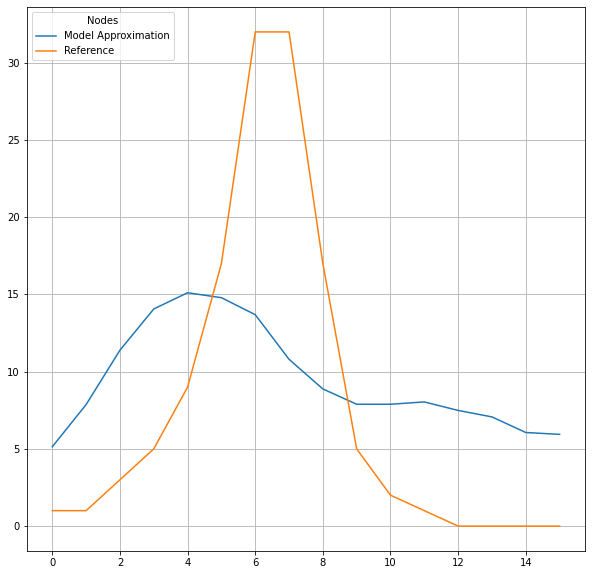

updating precision
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:33<00:00,  3.01it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:31<00:00,  3.18it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:31<00:00,  3.15it/s]


Moving Local Optima
Starting Parameters with k=3, beta=0.2, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.05it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:32<00:00,  3.09it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:33<00:00,  2.98it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:32<00:00,  3.05it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:34<00:00,  2.94it/s]


Moving Local Optima
Starting Parameters with k=4, beta=0.15, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.15it/s]


updating precision
Starting Parameters with k=4, beta=0.15, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:31<00:00,  3.18it/s]

Moving Local Optima
EXIT


In [19]:
best = GradientOptimizer(k=10, beta=0.3, ro=0.6, step_k=2, step_beta=0.1, step_ro=0.1)

Starting Parameters with k=4, beta=0.3, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.14it/s]

Best RMSE located : 12.1 at: beta=0.2 k=4 ro=0.5


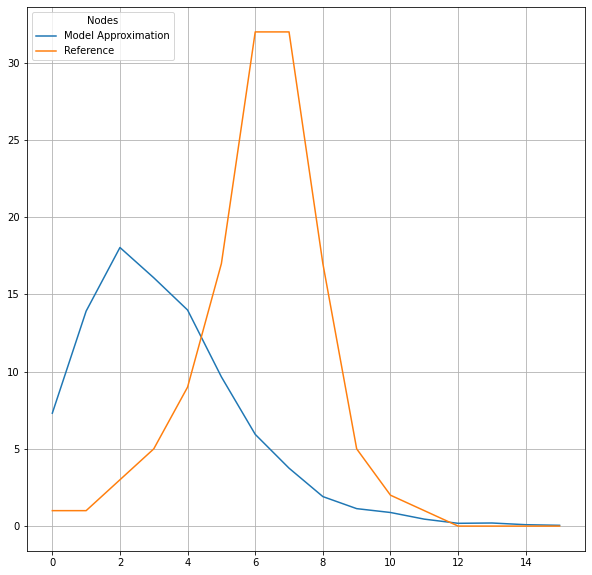

Moving Local Optima
Starting Parameters with k=4, beta=0.2, ro=0.5


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.19it/s]

Best RMSE located : 11.4 at: beta=0.1 k=6 ro=0.4


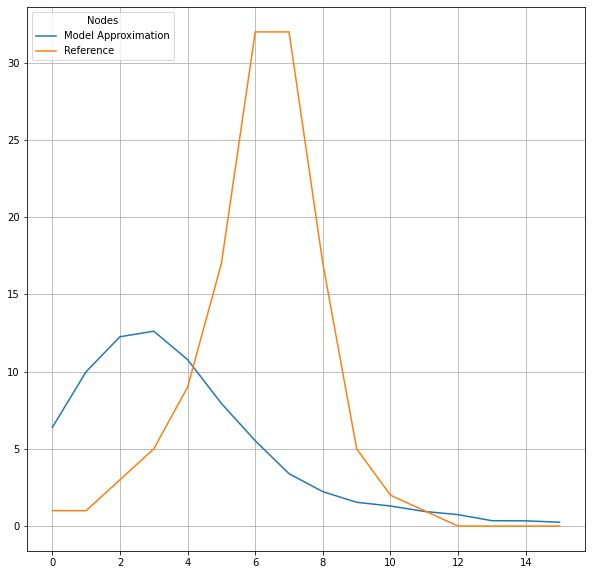

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.4


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.49it/s]

Best RMSE located : 10.7 at: beta=0.1 k=6 ro=0.3


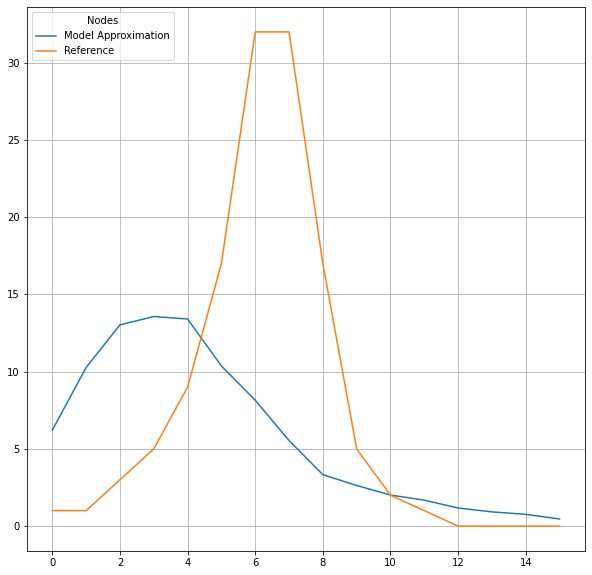

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.3


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:27<00:00,  3.60it/s]

Best RMSE located : 10.4 at: beta=0.1 k=6 ro=0.2


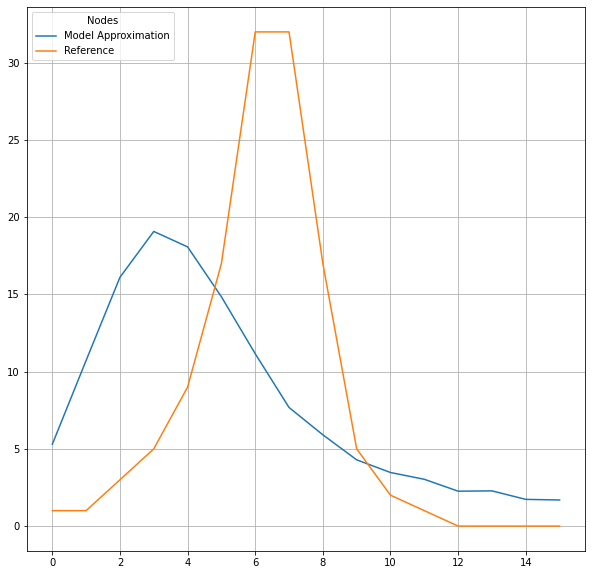

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.2


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.79it/s]

Best RMSE located : 10.1 at: beta=0.1 k=6 ro=0.1


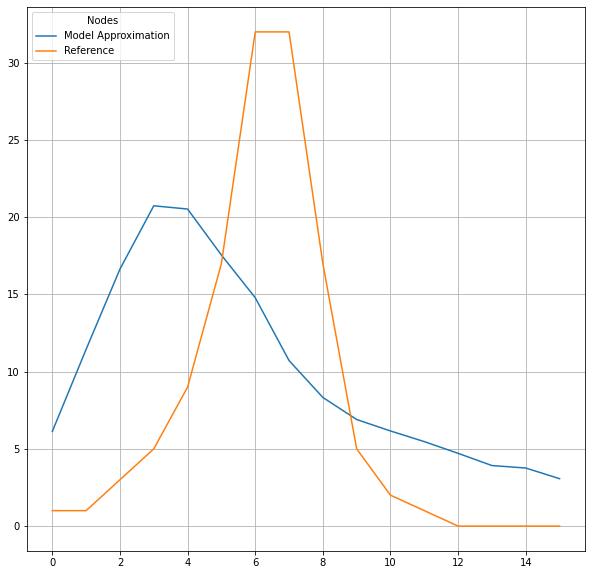

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.74it/s]

Best RMSE located : 9.64 at: beta=0.1 k=6 ro=0.1


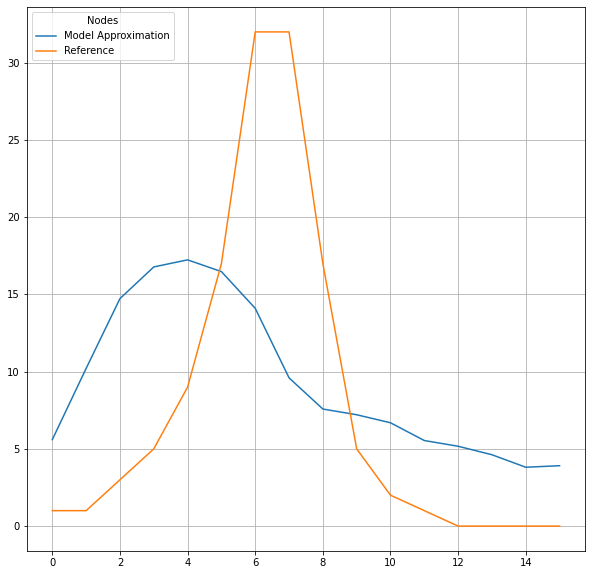

updating precision
Starting Parameters with k=6, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.56it/s]

Best RMSE located : 9.14 at: beta=0.1 k=5 ro=0.05


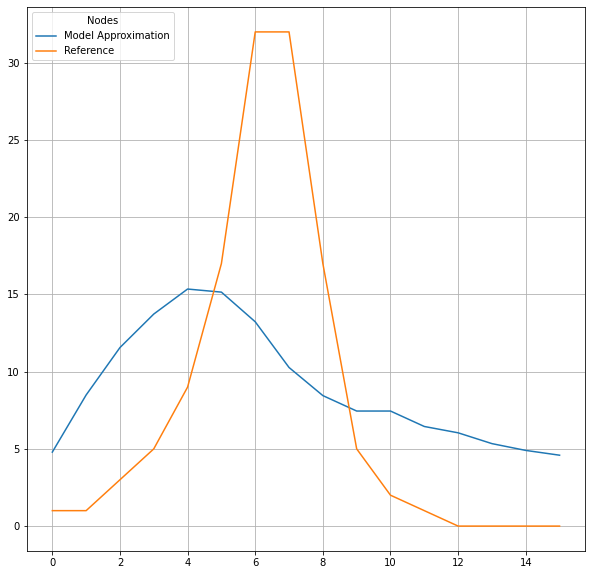

Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.11it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.14it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.88it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:27<00:00,  3.65it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.97it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.92it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.27it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.79it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.30it/s]

updating precision
EXIT


In [20]:
best = GradientOptimizer(k=4, beta=0.3, ro=0.6, step_k=2, step_beta=0.1, step_ro=0.1)

Starting Parameters with k=8, beta=0.3, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.04it/s]

Best RMSE located : 17.7 at: beta=0.2 k=6 ro=0.7


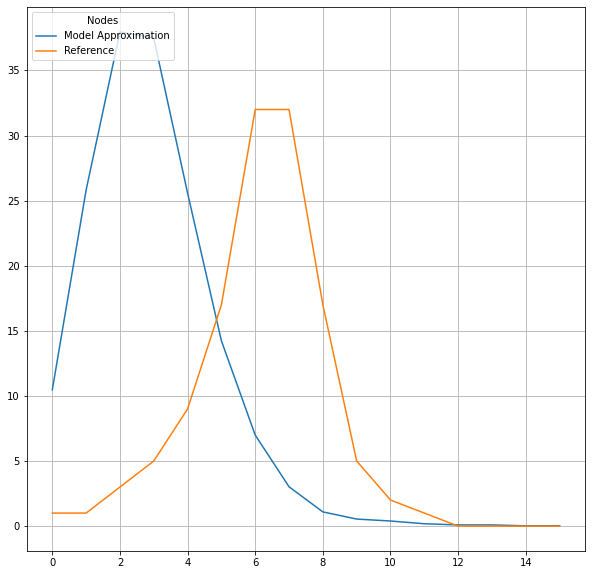

Moving Local Optima
Starting Parameters with k=6, beta=0.2, ro=0.7


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.94it/s]

Best RMSE located : 11.7 at: beta=0.1 k=8 ro=0.6


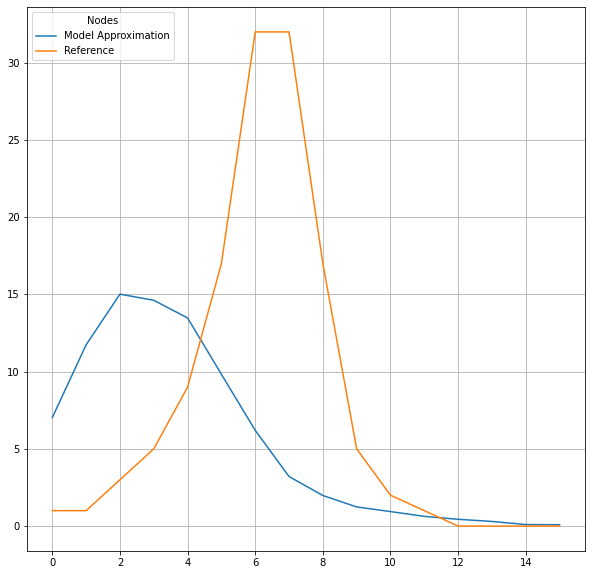

Moving Local Optima
Starting Parameters with k=8, beta=0.1, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:31<00:00,  3.18it/s]

Best RMSE located : 11.6 at: beta=0.1 k=8 ro=0.5


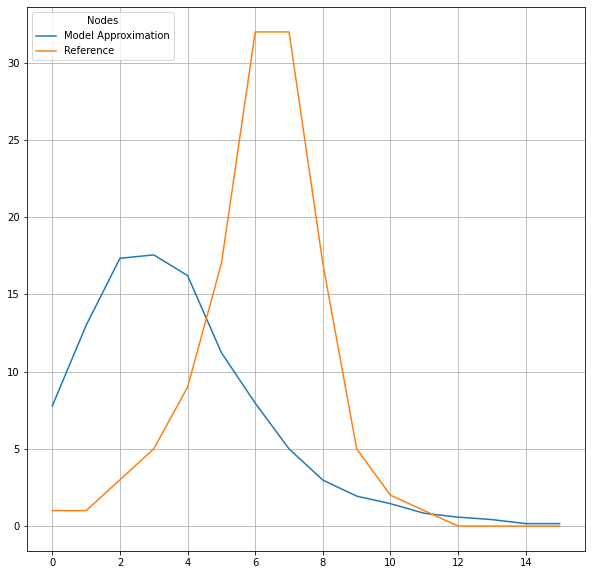

Moving Local Optima
Starting Parameters with k=8, beta=0.1, ro=0.5


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:29<00:00,  3.34it/s]

Best RMSE located : 11.1 at: beta=0.1 k=6 ro=0.4


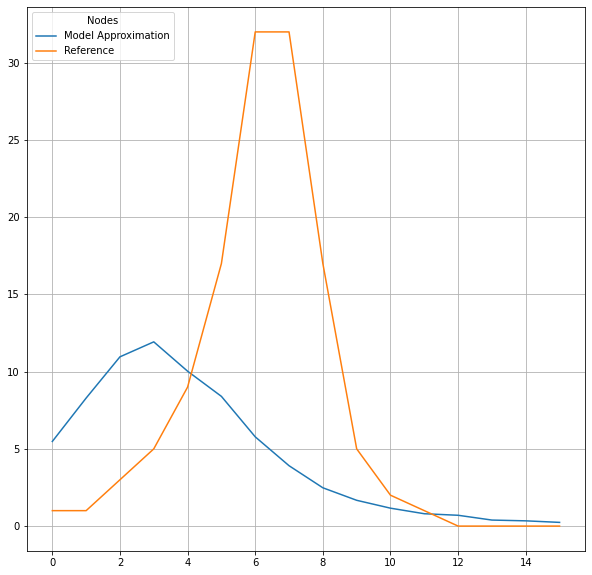

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.4


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.48it/s]

Best RMSE located : 10.7 at: beta=0.1 k=6 ro=0.3


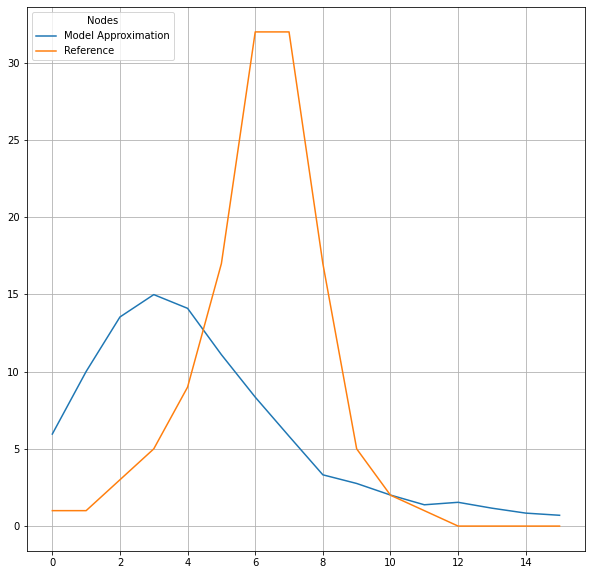

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.3


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.56it/s]

Best RMSE located : 10 at: beta=0.1 k=6 ro=0.2


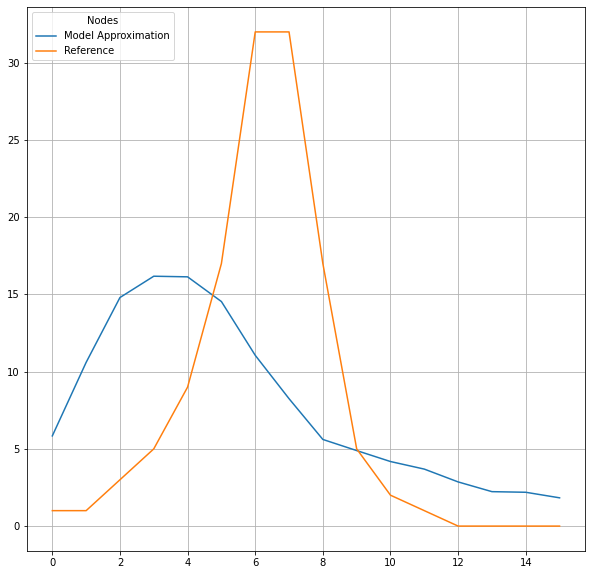

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.2


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.80it/s]

Best RMSE located : 9.7 at: beta=0.1 k=6 ro=0.1


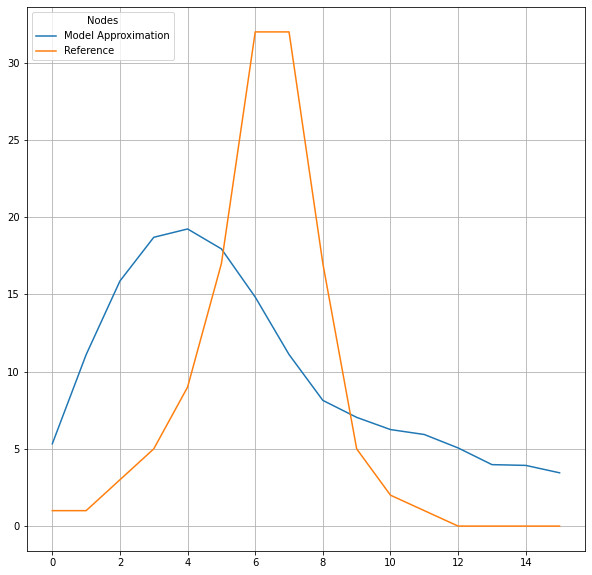

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.78it/s]

Best RMSE located : 9.57 at: beta=0.1 k=6 ro=0.1


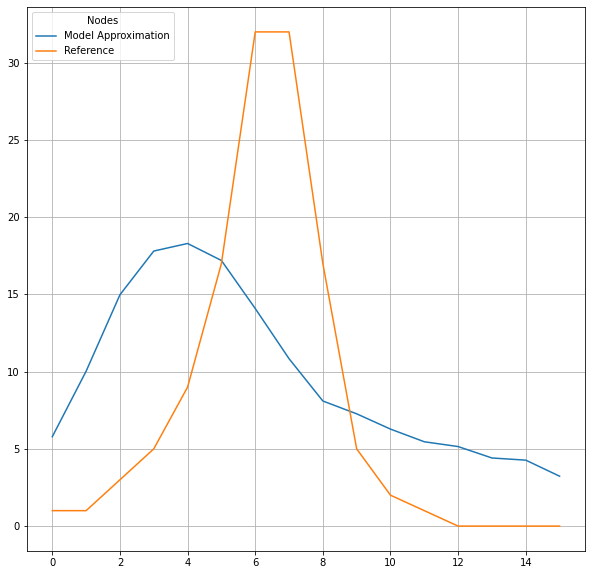

updating precision
Starting Parameters with k=6, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:27<00:00,  3.61it/s]

Best RMSE located : 9.55 at: beta=0.1 k=5 ro=0.05


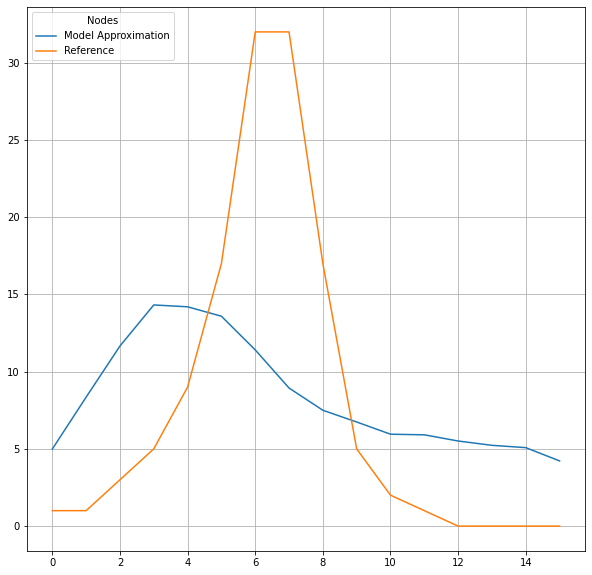

Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.83it/s]

Best RMSE located : 9.43 at: beta=0.1 k=5 ro=0


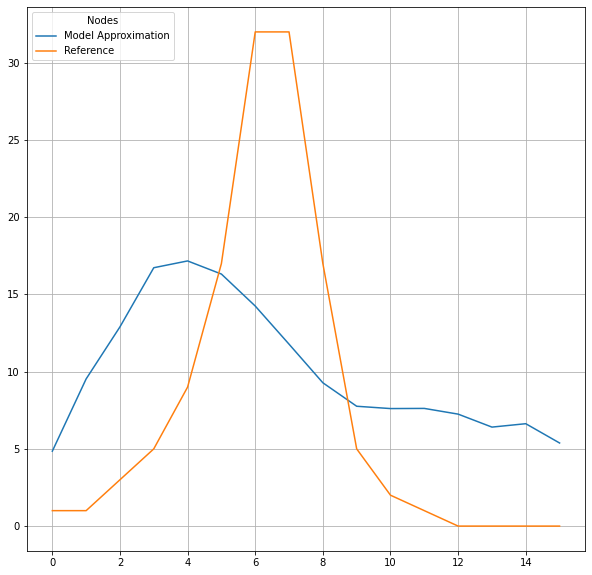

Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.87it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.80it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.01it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:29<00:00,  3.40it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.75it/s]

Best RMSE located : 9.41 at: beta=0.1 k=5 ro=0.05


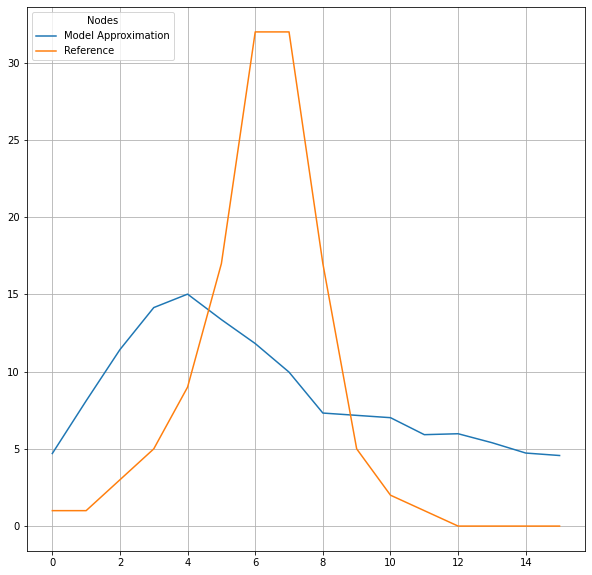

updating precision
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.48it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.02it/s]

Best RMSE located : 9.29 at: beta=0.1 k=5 ro=0


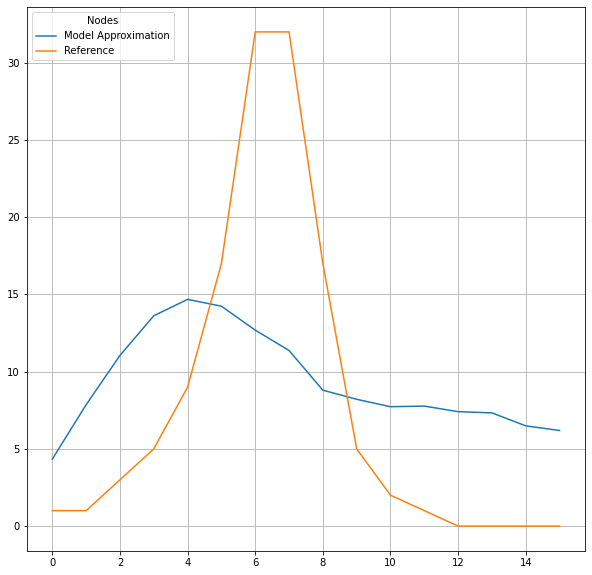

updating precision
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:29<00:00,  3.41it/s]

Best RMSE located : 9.2 at: beta=0.1 k=5 ro=0.05


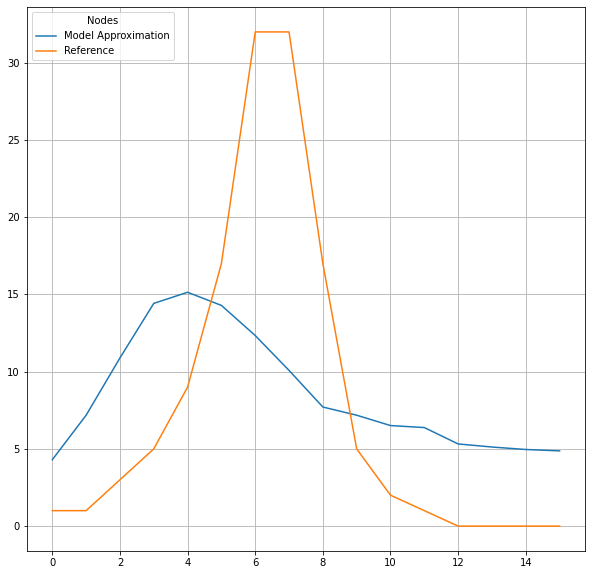

Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.90it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.89it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.33it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:26<00:00,  3.76it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.91it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.26it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.87it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.51it/s]


Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.15it/s]


updating precision
Starting Parameters with k=5, beta=0.1, ro=0


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:29<00:00,  3.34it/s]

updating precision
EXIT


In [21]:
best = GradientOptimizer(k=8, beta=0.3, ro=0.6, step_k=2, step_beta=0.1, step_ro=0.1)

# 2 Coloring

In [1]:
import numpy as np # To input the adjacency matrix as a 2-D array
import networkx as nx # To use graph features
import matplotlib.pyplot as plt # To display a graphical view of the graph
import random

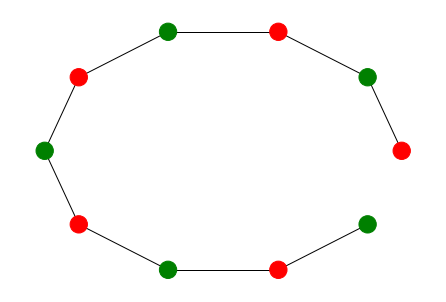

In [3]:
# we used back_tracking DFS to solve this problem
def problem_one():
    G = nx.Graph()  # creating Graph G
    numofnodes = 10  # number of nodes
    adj_matrix = [
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
    ]  # adjacency matrix for line like graph
    adj_matrix = np.array(adj_matrix)
    # print(adj_matrix)
    G = nx.from_numpy_array(adj_matrix)  # creating graph with adjacency matrix
    G.add_nodes_from(G.nodes(), color='black')  # Initializing graph with black-colored nodes
    color_list = ['red', 'green']
    
    def assignColor(node_):
        safe_color_list = color_list.copy()
        for nd in G.adj[node_].keys():
            if G.nodes[nd]['color'] != 'black':
                safe_color_list.remove(G.nodes[nd]['color'])
        G.nodes[node_]['color'] = safe_color_list[0]
        for nd_ in G.adj[node_].keys():
            if G.nodes[nd_]['color'] == 'black':
                assignColor(nd_)

    node_colors = []
    for nd in G.nodes():
        if G.nodes[nd]['color'] == 'black':
            assignColor(nd)
        node_colors.append(G.nodes[nd]['color'])
    pos = nx.circular_layout(G)  # Set position layout
    nx.draw(G, pos, node_color=node_colors)
    plt.axis('off')  # To prevent showing X-Y axes
#    plt.show()  # Displays the graph
    plt.savefig("problem2(a).pdf", format="pdf", bbox_inches="tight")
if __name__ == '__main__':
     problem_one()

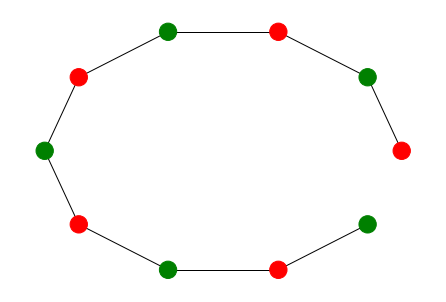

In [24]:
def problem_two():
    data = np.loadtxt('wifi.mat')  # Loading wifi.mat file with numpy
    pos = np.loadtxt('coords.mat')
    data = np.array(data)  # Converting to Numpy array as adjacency matrix
    pos = np.array(pos)
    data = (np.rint(data)).astype(int)  # showing edges between nodes by 1 as an integer number
    G = nx.Graph()  # creating Graph G
    numofnodes = 100  # number of nodes
    G = nx.from_numpy_array(data)  # creating graph with adjacency matrix
    G.add_nodes_from(G.nodes(), color='red')
    color_list = ['red', 'green', 'blue', 'yellow', 'magenta', 'cyan', 'white', 'black']

    def greedy_coloring_algorithm(network, colors):
        nodes = list(network.nodes())
        random.shuffle(nodes)  # step 1 random ordering
        for node in nodes:
            dict_neighbors = dict(network[node])          # همسایه های نود رو هم در یک دیکشنری ذخیره میکنیم
            # gives names of nodes that are neighbors
            nodes_neighbors = list(dict_neighbors.keys())   # اعداد شماره نود هستند

            forbidden_colors = []
            for neighbor in nodes_neighbors:

                len(network.nodes.data()[1].keys())
                if len(network.nodes.data()[neighbor].keys()) == 0:
                    # if the neighbor has no color, proceed
                    continue
                else:
                    # if the neighbor has a color,
                    # this color is forbidden

                    forbidden_color = network.nodes.data()[neighbor]
                    forbidden_color = forbidden_color['color']
                    forbidden_colors.append(forbidden_color)
            # assign the first color
            # that is not forbidden
            for color in colors:
                # step 2: start everytime at the top of the colors,
                # so that the smallest number of colors is used
                if color in forbidden_colors:
                    continue
                else:
                    # step 3: color one node at the time
                    network.nodes[node]['color'] = color
                    break

    greedy_coloring_algorithm(G, color_list)
    colors_nodes = [data['color'] for v, data in G.nodes(data=True)]
    nx.draw(G, pos, node_color=colors_nodes, with_labels=True)
    plt.axis('off')  # To prevent showing X-Y axes
#    plt.show()  # Displays the graph
    plt.savefig("problem2(b).pdf", format="pdf", bbox_inches="tight")


if __name__ == '__main__':
     problem_one()
   # problem_two()

#%%